# Trabalho Computacional 2: Perceptron Multicamada no problema MNIST

In [ ]:
import tensorflow as tf
from d2l import tensorflow as d2l
d2l.use_svg_display()
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from sklearn.metrics import confusion_matrix

### Classe **MNIST** para representação do conjunto de dados

In [2]:
class MNIST(d2l.DataModule):  #@save
    """The MNIST dataset."""
    def __init__(self, batch_size=64):
        super().__init__()
        self.save_hyperparameters()
        self.train, self.val = tf.keras.datasets.mnist.load_data()
    
    def get_dataloader(self, train):
        data = self.train if train else self.val
        process = lambda X, y: (tf.expand_dims(X, axis=3) / 255, # Set pixel B&W value in the range [0,1]
                                tf.cast(y, dtype='int32'))
        resize_fn = lambda X, y: (tf.image.resize_with_pad(X, *self.resize), y)
        shuffle_buf = len(data[0]) if train else 1
        return tf.data.Dataset.from_tensor_slices(process(*data)).batch(
            self.batch_size).shuffle(shuffle_buf)

### Classe **MPLCLassifer** para representação do *perceptron* multicamadas com saída ativada por *softmax*.

Na implementação da classe, inclui o parâmetro *hidden_layers* para definir as camadas ocultas da rede neural. Esse parâmetro recebe como argumento um lista de tuplas contendo o tamanho da camada oculta (número de neurônios/unidades ocultas) e uma _string_ indicando a função de ativação para essa camada. Por padrão, os pesos das camadas ocultas são inicializados por meio de uma distribuição normal de média 0 e desvio-padrão definido pelo atributo *sigma*, com valor padrão de 0.01. Também podem ser escolhidas as inicializações Xavier, tanto utilizando uma distribuição normal quanto uniforme. Além disso, por ser uma subclasse da classe **Classifier** do D2L, a função de custo empregada é a entropia cruzada, herdada dessa classe, a qual também aplica a ativação *softmax* na saída do modelo.<br>
Por fim, o parâmetro booleano *adam* o otimizador Adam para o modelo instanciando.<br><br>
Também reimplementei a função que retorna o algoritmo de otimização da biblioteca D2L com um parâmetro booleano que possibilita retornar o otimizador Adam. Por padrão, a função retorna a otimização por descida de gradiente estocástico. <br><br>
Além disso, reimplementei as funções de plotagem do treinamento para alterar as legendas para o português.

In [3]:
class MLPClassifer(d2l.Classifier): #@save
    def __init__(self, num_outputs, hidden_layers: list[(int, str)], lr = 0.01, sigma = 0.01, initializer="gaussian", adam=False):
        super().__init__()
        self.save_hyperparameters()
        self.adam = adam
        initializers = {
            "gaussian": tf.keras.initializers.RandomNormal(stddev=sigma),
            "xavierNormal": tf.keras.initializers.GlorotNormal(),
            "xavierUniform": tf.keras.initializers.GlorotUniform()
        }
        self.net = tf.keras.models.Sequential([
            tf.keras.layers.Flatten(),
            *[tf.keras.layers.Dense(neurons, activation, kernel_initializer=initializers[initializer]) 
              for neurons, activation in hidden_layers],
            tf.keras.layers.Dense(num_outputs)  
        ])
    
    def configure_optimizers(self):
        return tf.keras.optimizers.Adam(self.lr) if self.adam else tf.keras.optimizers.SGD(self.lr)
    
    def plot(self, legend, value, train): 
        assert hasattr(self, 'trainer'), 'Trainer is not inited'
        self.board.xlabel = 'Época'
        if train:
            x = self.trainer.train_batch_idx / \
                self.trainer.num_train_batches
            n = self.trainer.num_train_batches / \
                self.plot_train_per_epoch
        else:
            x = self.trainer.epoch + 1
            n = self.trainer.num_val_batches / \
                self.plot_valid_per_epoch
        self.board.draw(x, d2l.numpy(value), legend, every_n=int(n))
        
    def training_step(self, batch):
        l = self.loss(self(*batch[:-1]), batch[-1])
        self.plot('Erro - Treino', l, train=True)
        return l
        
    def validation_step(self, batch):
        Y_hat = self(*batch[:-1])
        self.plot('Erro - Validação', self.loss(Y_hat, batch[-1]), train=False)
        self.plot('Acurácia', self.accuracy(Y_hat, batch[-1]), train=False)

Abaixo, pode-se observar uma avaliação inicial da classe **MPLClassifier** com uma camada oculta com 128 unidades e função de ativação sigmóide. Após o treinamento, é chamada a função *evaluate_accuracy* da biblioteca D2L que retorna a acurácia do modelo ao final do treinamento.

Acurácia: 0.9134


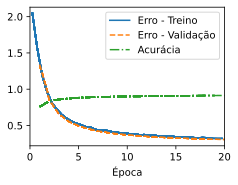

In [4]:
data = MNIST()
model = MLPClassifer(10, [(128, "sigmoid")])
trainer = d2l.Trainer(20)
trainer.fit(model, data)
print(f"Acurácia: {d2l.evaluate_accuracy(model, data.val_dataloader())}")

Para avaliar os efeitos de diferentes combinações de hiperparâmetros no treinamento da rede neural com a arquitetura acima, escolhi 3 valores para a taxa de aprendizado (0.01, 0.03, 0.05) e 2 valores para o tamanho do lote (64, 128), resultando em 6 possíveis combinações de hiperparâmetros. Mantive o número de épocas de treinamento fixo em 20. Realizei o treinamento 3 vezes para cada combinação e calculei a média da acurácia dos modelos.

In [5]:
def     batchTraining(lr: float, batch_size: int, title: str, adam=False, fn="sigmoid")->tuple[list[MLPClassifer], int]:
    fig, axes = plt.subplots(1, 3, figsize=(10,3), layout="constrained")
    
    fig.suptitle(title)
    
    data = MNIST(batch_size)
    models = [MLPClassifer(10, [(128, fn)], lr=lr, adam=adam) for _ in range(3)] # Set models
    trainer = d2l.Trainer(20)
    
    for i, model in enumerate(models):
        plt.sca(axes[i])
        model.board.fig = fig
        trainer.fit(model, data)
    
    return (models, batch_size)

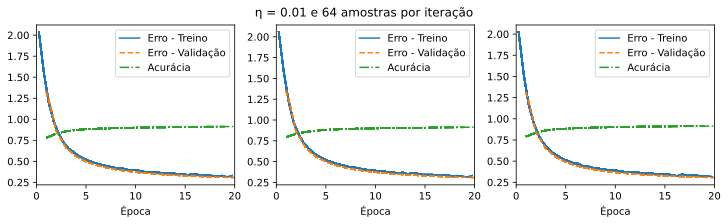

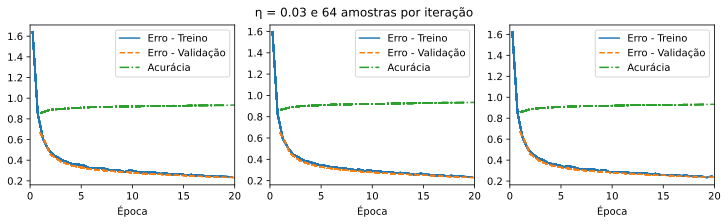

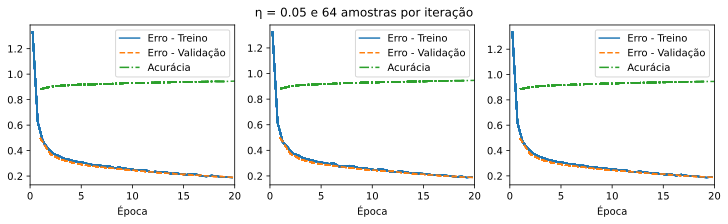

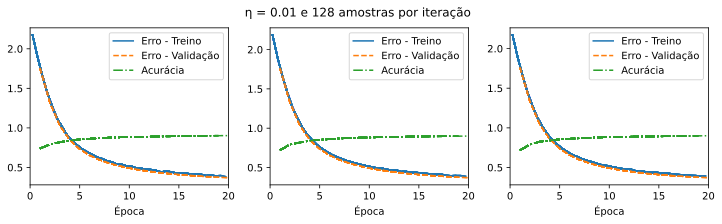

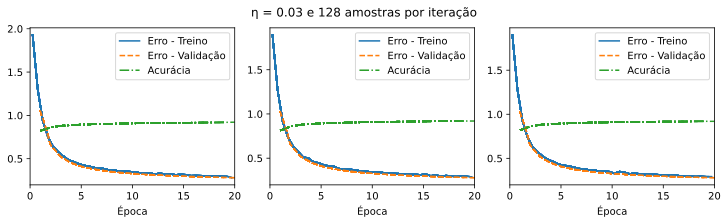

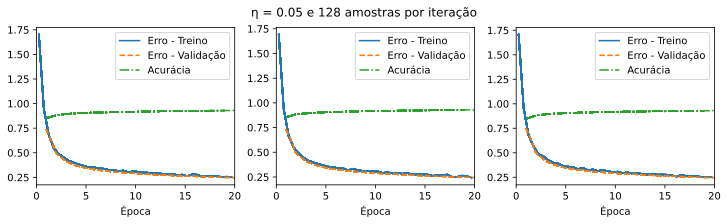

In [6]:
from itertools import product

lrs = [0.01, 0.03, 0.05]
batch_sizes = [64, 128]

models = list(product(batch_sizes, lrs))

for i in range(len(models)):
    batch_size, eta = models[i]
    models[i] = batchTraining(eta, batch_size, f"η = {eta} e {batch_size} amostras por iteração")

In [7]:
accuracies_stats = { size: {} for size in batch_sizes }
val_data = data.val_dataloader()

for model in models:
    size = model[-1]
    label = model[:-1][0][0].lr
    accuracies = [d2l.evaluate_accuracy(m, val_data) for m in model[:-1][0]]
    accuracies_stats[size][label] = (np.mean(accuracies), np.std(accuracies))

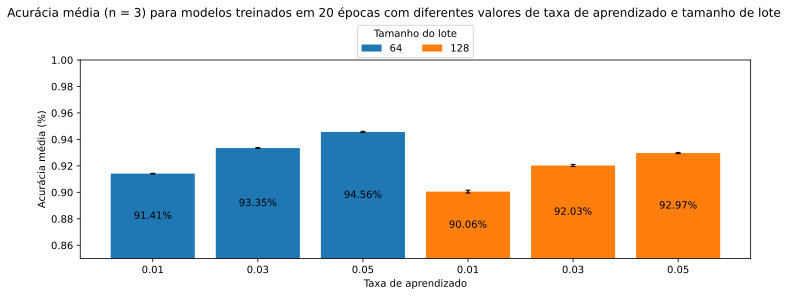

In [8]:
fig, ax = plt.subplots(1,1, figsize=(10,4), layout="constrained")

fig.suptitle("Acurácia média (n = 3) para modelos treinados em 20 épocas com diferentes valores de taxa de aprendizado e tamanho de lote")

for i, size in enumerate(accuracies_stats):
    accuracies = np.reshape([accuracies_stats[size][lr] for lr in accuracies_stats[size]], (-1,2))
    b = ax.bar(range(i*3,i*3+3), accuracies[:,0], yerr=accuracies[:,1], capsize=2.5)
    b.set_label(size)
    ax.bar_label(b, label_type="center", fmt=lambda n: f"{n*100:.2f}%")

ax.set_xticks(range(6), [*lrs]*2)
ax.set_ylabel("Acurácia média (%)")
ax.set_xlabel("Taxa de aprendizado")
ax.set_ybound(0.85, 1.0)
ax.legend(title="Tamanho do lote", ncols=3, loc="upper center", bbox_to_anchor=(0.5,1.2));


Com o otimizador SGD e função de ativação sigmóide na única camada oculta com 128 neurônios, a melhor escolha de hiperparâmetros entre as testadas foi a taxa de aprendizado igual a 0.05 e 64 amostras de dados por iteração. Em seguida, novos modelos foram treinados nas mesmas condições, dessa vez utilizando o otimizador Adam, o qual ajusta o valor da taxa de aprendizado para cada parâmetro com base na média e variância do gradiente.

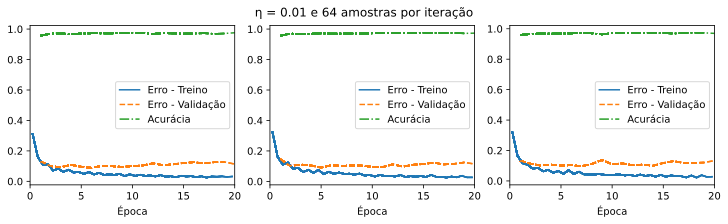

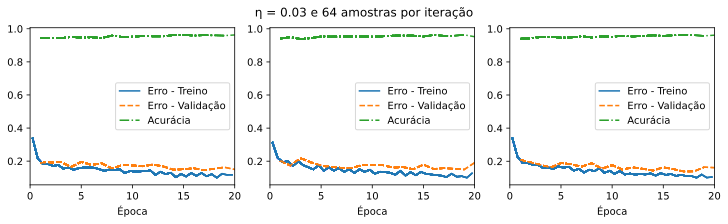

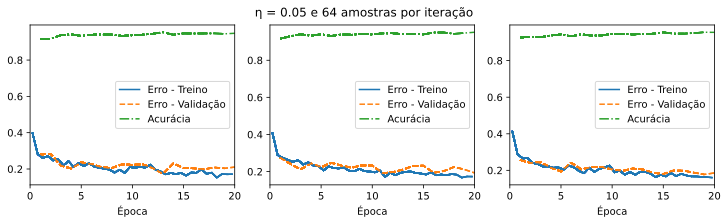

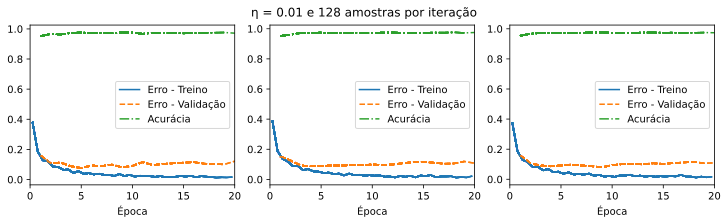

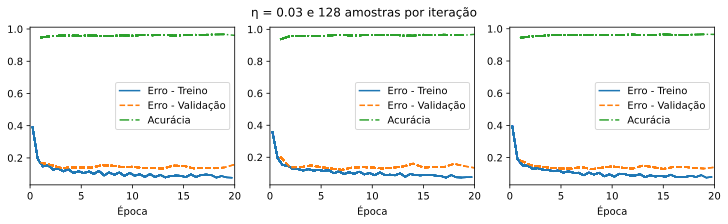

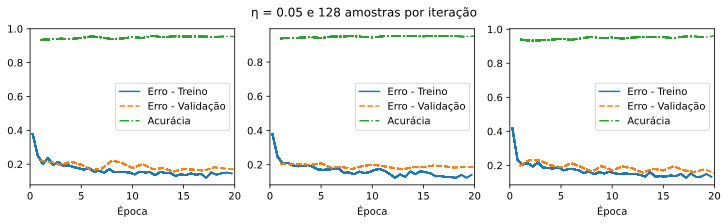

In [9]:
models_adam = list(product(batch_sizes, lrs))
for i in range(len(models_adam)):
    batch_size, eta = models_adam[i]
    models_adam[i] = batchTraining(eta, batch_size, f"η = {eta} e {batch_size} amostras por iteração", adam=True)

In [10]:
adam_accuracies_stats = { size: {} for size in batch_sizes }
val_data = data.val_dataloader()

for model in models_adam:
    size = model[-1]
    label = model[:-1][0][0].lr
    accuracies = [d2l.evaluate_accuracy(m, val_data) for m in model[:-1][0]]
    adam_accuracies_stats[size][label] = (np.mean(accuracies), np.std(accuracies))

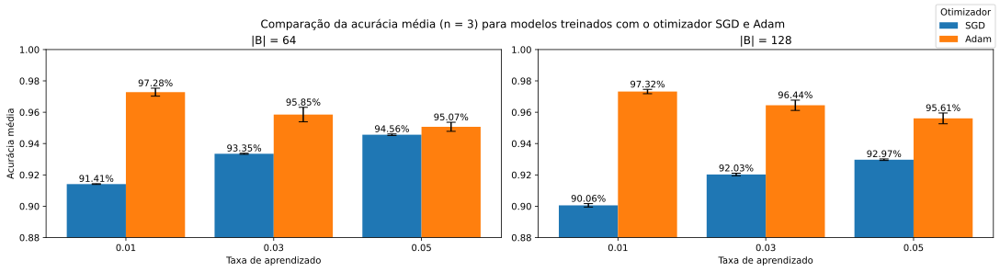

In [11]:
set_bar = lambda ax, means, stds, align_left: ax.bar(range(0, 14, 5), means, yerr=stds, align="edge", capsize=5, width=2 if align_left else -2)

plot_data = { size: 
                { lr: 
                    { 
                        "sgd": { "mean": accuracies_stats[size][lr][0], "std": accuracies_stats[size][lr][1] },
                        "adam": { "mean": adam_accuracies_stats[size][lr][0], "std": adam_accuracies_stats[size][lr][1] }
                    }
                for lr in lrs } 
            for size in batch_sizes }

fig, axes = plt.subplots(1,2, figsize=(15,4), layout="constrained")
fig.suptitle("""
             Comparação da acurácia média (n = 3) para modelos treinados com o otimizador SGD e Adam""")


for ax, size in zip(axes, batch_sizes):
    ax.set_title(f"|B| = {size}")
    sgd_container = set_bar(ax, 
                            [plot_data[size][lr]["sgd"]["mean"] for lr in lrs],
                            [plot_data[size][lr]["sgd"]["std"] for lr in lrs], 
                            align_left=False)
    ax.bar_label(sgd_container, label_type="edge", fmt=lambda n: f"{n*100:.2f}%")
    
    adam_container = set_bar(ax,
                            [plot_data[size][lr]["adam"]["mean"] for lr in lrs],
                            [plot_data[size][lr]["adam"]["std"] for lr in lrs],
                            align_left=True)
    ax.bar_label(adam_container, label_type="edge", fmt=lambda n: f"{n*100:.2f}%")

axes[0].set_ylabel("Acurácia média")

for ax in axes:
    ax.set_xticks(range(0, 14, 5), lrs)
    ax.set_xlabel("Taxa de aprendizado")
    ax.set_ybound(0.88, 1.0)

fig.legend([sgd_container, adam_container], ["SGD", "Adam"], title="Otimizador", ncols=1, loc="upper right");


Comparando com o otimizador SGD, são notáveis os melhores resultados obtidos com o otimizador Adam. Para todos as combinações de hiperparâmetros testadas, houve um acréscimo da acurácia obtida em relação àquela com o otimizador SGD. Em particular, com a taxa de aprendizado de 0,01 e 128 amostras de dados por iteração, a acurácia média obtida apresentou um aumento de cerca de 7%. Já a menor acurácia obtida ocorreu com a taxa de aprendizado igual a 0,05 e 64 amostras de dados por iteração, valores que resultaram no melhor modelo utilizando o otimizador SGD.<br>
Intuitivamente, é de se esperar que uma taxa de aprendizado menor esteja relacionada a melhores resultados obtidos com o otimizador Adam, uma vez que, caso necessário, a taxa será aumentada pelo otimizador. Começando com taxas maiores, o passo dado em direção ao gradiente negativo para um parâmetro pode fazer a função de custo ultrapassar um valor mínimo e, nesses casos, o otimizador buscaria reduzir a taxa para esse parâmetro. Com valores menores, isso tende a ser evitado e o treinamento pode ser mais eficiente para obter um ajuste ideal dos parâmetros.<br>
Nota-se também que durante o treinamento dos modelos, há um grau de _overfitting_ maior em comparação aos modelos treinados com o otimizador SGD. No entanto, evidentemente isso não prejudicou a acurácia obtida dos modelos.<br><br>
Em seguida, nas mesmas condições e com o otimizador Adam, novos modelos foram treinados utilizando a função de ativação ReLU ao invés da sigmóide na camada oculta.

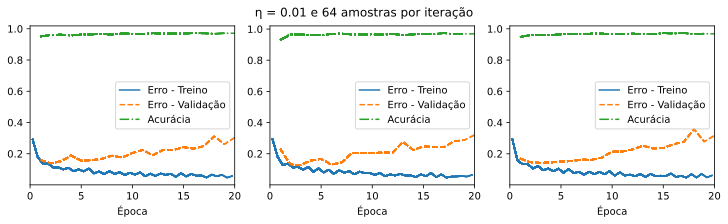

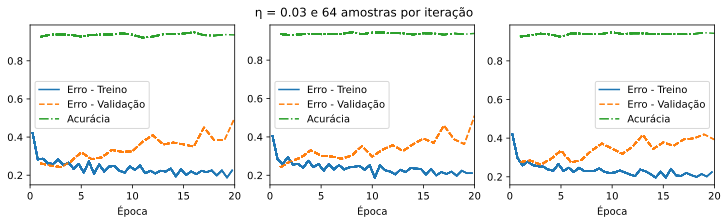

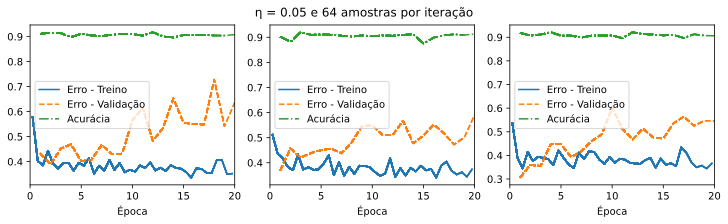

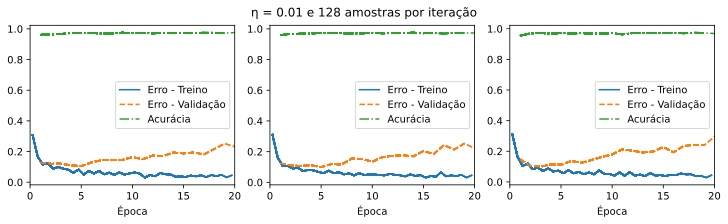

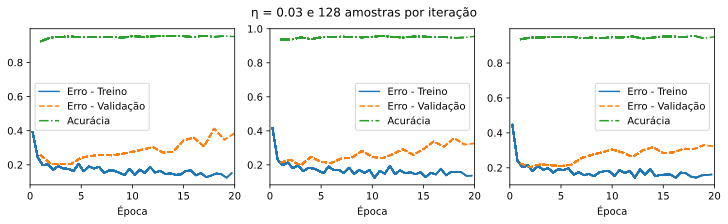

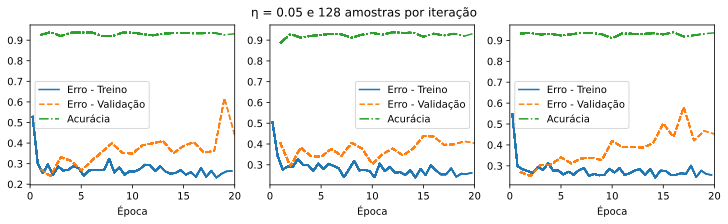

In [12]:
adam_relu_models = list(product(batch_sizes, lrs))

for i, (batch_size, eta) in enumerate(adam_relu_models):
    adam_relu_models[i] = batchTraining(eta, batch_size, f"η = {eta} e {batch_size} amostras por iteração", adam=True, fn="relu")    

In [13]:
val_data = data.val_dataloader()    

adam_relu_models_accuracies = [[d2l.evaluate_accuracy(model, val_data) for model in set[:-1][0]] for set in adam_relu_models]
adam_relu_models_stats = np.reshape([(np.mean(accuracies), np.std(accuracies)) for accuracies in adam_relu_models_accuracies], (-1,2))

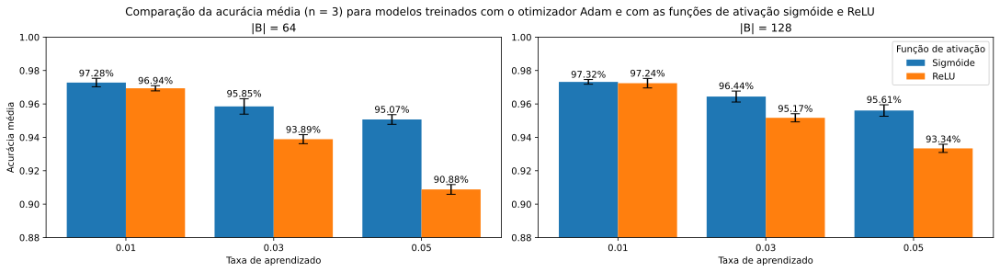

In [33]:
fig, axes = plt.subplots(1,2, figsize=(15,4), layout="constrained")
fig.suptitle("Comparação da acurácia média (n = 3) para modelos treinados com o otimizador Adam e com as funções de ativação sigmóide e ReLU")

for i, (ax, size) in enumerate(zip(axes, batch_sizes)):
    ax.set_title(f"|B| = {size}")
    sigmoid_container = set_bar(ax, 
                            [plot_data[size][lr]["adam"]["mean"] for lr in lrs],
                            [plot_data[size][lr]["adam"]["std"] for lr in lrs], 
                            align_left=False)
    ax.bar_label(sigmoid_container, label_type="edge", fmt=lambda n: f"{n*100:.2f}%")
    
    adam_relu_means, adam_relu_stds = adam_relu_models_stats[3*i:3*i + 3,0], adam_relu_models_stats[3*i:3*i + 3,1]
    relu_container = set_bar(ax, adam_relu_means, adam_relu_stds, align_left=True)
    ax.bar_label(relu_container, label_type="edge", fmt=lambda n: f"{n*100:.2f}%")

axes[0].set_ylabel("Acurácia média")

for ax in axes:
    ax.set_xticks(range(0, 14, 5), lrs)
    ax.set_xlabel("Taxa de aprendizado")
    ax.set_ybound(0.88, 1.0)

fig.legend([sgd_container, adam_container], ["Sigmóide", "ReLU"], title="Função de ativação", ncols=1, loc="upper right", bbox_to_anchor=(0.9975,0.875));

Pode-se afirmar que, para algumas combinações de hiperparâmetros, a acurácia obtida foi equivalente. No entanto, os resultados obtidos com a função de ativação sigmóide foram mais satisfatórios no geral, principalmente para taxas de aprendizado mais altas. Comparando os resultados obtidos para os dois tamanhos de lote, pode-se notar que a taxa de aprendizado é mais relevante para uma melhor acurácia. Também é notável o maior grau de _overfitting_ durante o treinamento para cada modelo, principalmente nas épocas finais.<br><br>
Em seguida, foi avaliada a acurácia média obtida com 2 grupos de 5 modelos, cada um com uma única camada oculta com 256 neurônios. Para continuar comparando as funções de ativação, os modelos do primeiro grupo possuem como função de ativação dessa camada a função sigmóide, enquanto os do segundo grupo possuem a função ReLU. Considerando os resultados obtidos até aqui, daqui em diante os hiperparâmetros foram fixados com a taxa de aprendizado igual a 0,01, 20 épocas e 128 amostras de dados por iteração.

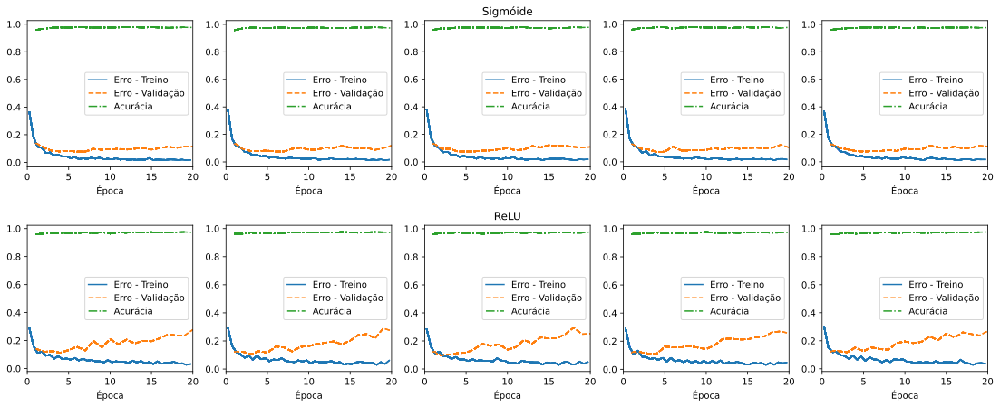

In [15]:
fig, axes = plt.subplots(2,5, figsize=(19,7))

data = MNIST(128)
trainer = d2l.Trainer(20)
adam_256h_models = [[MLPClassifer(10, [(256, "sigmoid")], lr=0.01, adam=True) for _ in range(5)],
                    [MLPClassifer(10, [(256, "relu")], lr=0.01, adam=True) for _ in range(5)]]

# Axes style adjustments
plt.subplots_adjust(hspace=0.4)
axes[0][2].set_title("Sigmóide")
axes[1][2].set_title("ReLU")

for i in range(2):
    for j in range(5):
        plt.sca(axes[i][j])
        
        model = adam_256h_models[i][j]
        model.board.fig = fig
        trainer.fit(model, data)
        
        

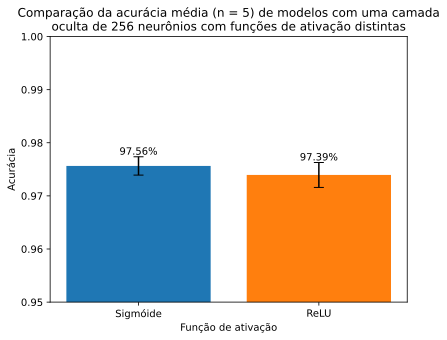

In [16]:
adam_256h_models_accuracy = [[d2l.evaluate_accuracy(model, data.val_dataloader()) for model in set] for set in adam_256h_models]
adam_256h_models_stats = [(np.mean(accuracies), np.std(accuracies)) for accuracies in adam_256h_models_accuracy]

fig, ax = plt.subplots(1,1)
for i, (mean, std) in enumerate(adam_256h_models_stats):
    b = ax.bar("Sigmóide" if not i else "ReLU", mean, yerr=std, capsize=5)
    ax.bar_label(b, label_type='edge', fmt=lambda n: f"{n*100:.2f}%")
    
ax.set_ylabel("Acurácia")
ax.set_xlabel("Função de ativação")
ax.set_ybound(0.95, 1.0)
ax.set_title("Comparação da acurácia média (n = 5) de modelos com uma camada\noculta de 256 neurônios com funções de ativação distintas");

Considerando o desvio-padrão da acurácia em cada grupo, é razoável afirmar que ambas as funções de ativação apresentaram resultados equivalentes, com um acurácia média por volta de 97%.<br><br>

Por fim, foram avaliados modelos com mais de uma camada oculta. No caso, foram definidos 4 grupos com 3 modelos cada. Em cada modelo, a primeira camada oculta possui 256 neurônios e a segunda possui 128. O que diferencia cada grupo são as funções de ativação nas camadas ocultas do modelo, que corresponde às 4 possíveis escolhas entre sigmóide e ReLU para as duas camadas (i.e. (sigmóide, sigmóide), (sigmóide, ReLU), (ReLU, sigmóide) e (ReLU, RelU)).

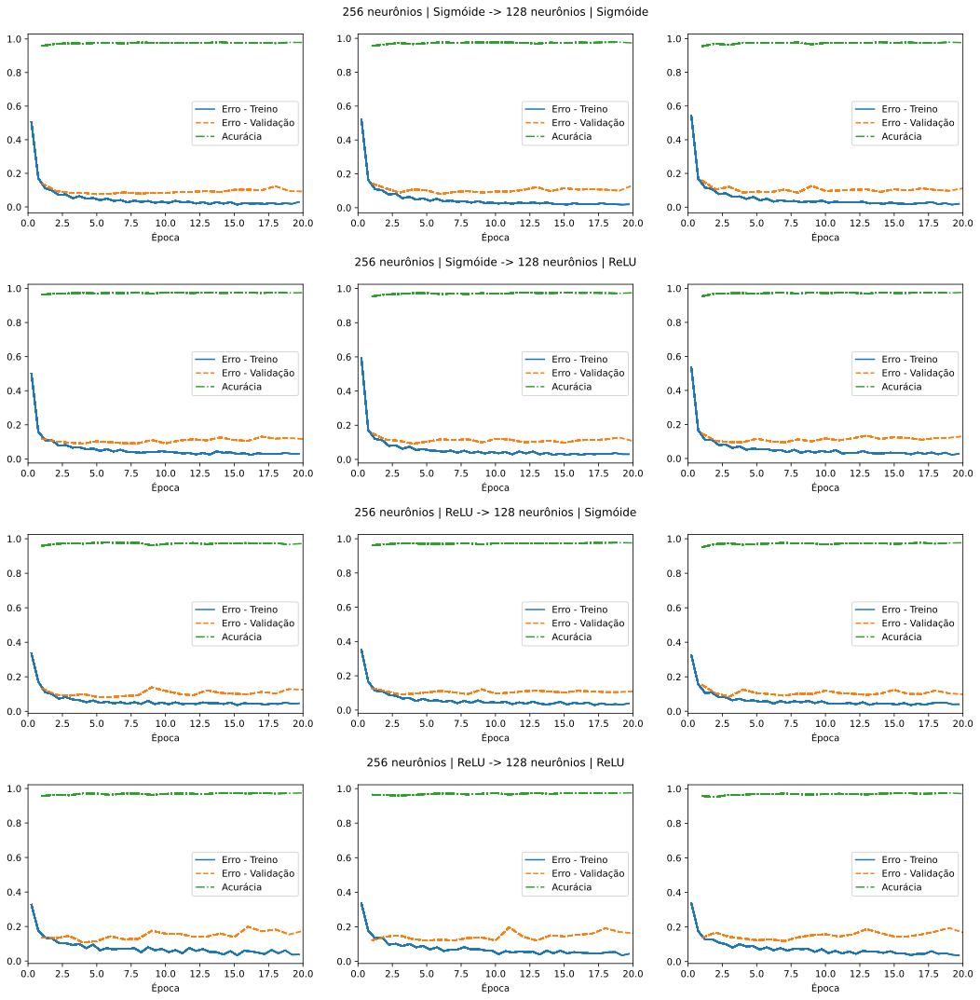

In [17]:
data = MNIST(128)
hidden_layers = list(product(product([256], ["sigmoid", "relu"]), product([128], ["sigmoid", "relu"])))
multiple_hl_models = [[MLPClassifer(10, hl, lr=0.01, adam=True) for _ in range(3)] for hl in hidden_layers]

fig, axes = plt.subplots(4, 3, figsize=(18, 18))
describe_layer = lambda t: f"{t[0]} neurônios | {'Sigmóide' if t[1] == 'sigmoid' else 'ReLU'}"
for i, (l1, l2) in enumerate(hidden_layers):
    axes[i][1].set_title(describe_layer(l1) + " -> " + describe_layer(l2) + "\n")
plt.subplots_adjust(hspace=0.4)

for i, set in enumerate(multiple_hl_models):
    for j, model in enumerate(set):
        plt.sca(axes[i][j])
        model.board.fig = fig
        trainer.fit(model, data)

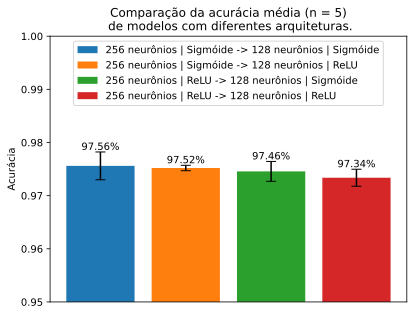

In [32]:
multiple_hl_models_accuracies = [[d2l.evaluate_accuracy(model, data.val_dataloader()) for model in set] for set in multiple_hl_models]
multiple_hl_models_stats = [(np.mean(accuracies), np.std(accuracies)) for accuracies in multiple_hl_models_accuracies]

fig, ax = plt.subplots(1,1)

for i, (mean, std) in enumerate(multiple_hl_models_stats):
    b = ax.bar(i, mean, yerr=std, capsize=5)
    b.set_label(f"{describe_layer(hidden_layers[i][0])} -> {describe_layer(hidden_layers[i][1])}")
    ax.bar_label(b, label_type='edge', fmt=lambda n: f"{n*100:.2f}%")
    
ax.set_ylabel("Acurácia")
ax.set_xticks([])
ax.set_ybound(0.95, 1.0)
ax.set_title("Comparação da acurácia média (n = 5)\n de modelos com diferentes arquiteturas.")
ax.legend(loc="upper center");

Novamente, devido ao desvio-padrão, pode-se notar que todas as arquiteturas apresentaram uma performance equivalente, com uma acurácia média por volta de 97%. Entretanto, devido ao menor desvio-padrão da arquitetura com as funções sigmóide e ReLU, nessa ordem, nas camadas ocultas, o modelo correspondente foi selecionado como "melhor modelo".<br>
Daí, foram observados alguns exemplos mal-classificados por esse modelo.

Inicialmente, foram identificados as classificações incorretas do melhor modelo, armazenadas em uma lista de tuplas contendo a classificação, a classe esperada e a imagem.

In [146]:
best_model = multiple_hl_models[1][0]

incorrect_predictions = []
for X, y in data.val_dataloader():
    y_hat = np.argmax(best_model(X), axis=1)
    incorrect_predictions += [(predicted, expected.numpy(), image.numpy()) 
                              for predicted, expected, image in zip(y_hat, y, X) 
                              if predicted != expected]

incorrect_predictions = np.array(incorrect_predictions, dtype=object)


Em seguida, utilizando a função *_show_images_* do pacote D2L por conveniência, pode-se apresentar as imagens junto com a classificação do modelo e a classe esperada. São selecionadas 25 imagens aleatórias dentre as classificações incorretas e apresentadas.<br> **Acima de cada imagem está incluída uma legenda no formato "_previsto_ | _esperado_"**.

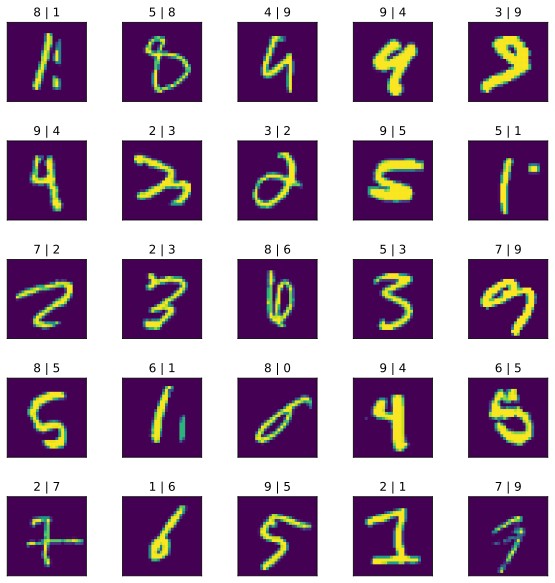

In [147]:
from random import choices

get_label = lambda p, e: f"{p} | {e}"

selected_predictions = np.array(choices(incorrect_predictions, k=25))
preds, y, images = selected_predictions[:,0], selected_predictions[:,1], selected_predictions[:,2]

labels = [get_label(predict, expected) for predict, expected in zip(preds, y)]
axes = d2l.show_images(images, 5, 5, titles=labels, scale=2.0);

plt.subplots_adjust(hspace=0.5);

Apesar de os dígitos de algumas imagens serem facilmente reconhecíveis, pode-se notar alguns casos em que o dígito representado é realmente indefinido ou de difícil (se não impossível) classificação. Em particular, há 4s que podem facilmente serem reconhecidos como 9s ou 3s que mais parecem 7s ou 9s, assim como dígitos que mais parecem letras ou somente um rabisco aleatório. Nesses casos, qualquer humano facilmente cometeria o mesmo erro (eu cometi).

Por fim, foi avaliada a matriz de confusão do melhor modelo.

In [174]:
predictions = np.concatenate([np.argmax(best_model(X), axis=1) for X,_ in data.val_dataloader()])
y = np.concatenate([y for _,y in data.val_dataloader()])

cm = pd.DataFrame(confusion_matrix(y, predictions))
cm

,0,1,2,3,4,5,6,7,8,9
0,968,0,1,0,0,0,5,1,3,2
1,0,1127,3,0,1,1,1,0,2,0
2,3,1,1011,1,1,0,5,3,7,0
3,0,1,8,969,0,10,0,8,8,6
4,1,0,0,0,962,0,4,1,0,14
5,3,0,1,5,4,849,10,2,11,7
6,3,4,0,1,8,3,932,0,7,0
7,3,2,7,0,2,0,0,1004,2,8
8,4,1,2,3,4,3,0,3,947,7
9,3,2,1,2,10,1,0,6,3,981


A matriz de confusão acima apresenta as classificações verdadeiras e preditas nas linhas e colunas, respectivamente. Logo, pode-se notar que a confusão mais comum foi 4 com 9, seguido de 5 com 8 e 9 com 4 e 3 com 5, com esses dois últimos pares com 10 erros.<br>
Comparando com o observado na visualização das imagens acompanhados da classificação do melhor modelo, as atribuições erradas mais comuns estão consistentes. Avaliando caso a caso, é relativamente fácil de visualizar o possível motivo para a troca. Por exemplo, para o dígito 7 que foi confundindo mais vezes com o dígito 9, pode-se imaginar que isso ocorreu devido a ambos apresentarem um segmento inferior voltado para o canto inferior esquerdo. Algo análogo pode ser dito para o dígito 9, cuja atribuição errada mais comum foi com o dígito 4. 